# Calculating Accessibility at Scale

**Author:** Alexander Michels

This notebook uses travel-time catchments calculated using the E2SFCA method to calculate spatial accessibility using the [Enhanced Two-Step Floating Catchment Area (E2SFCA)](https://doi.org/10.1016/j.healthplace.2009.06.002) method.

In [1]:
# !pip install contextily

In [2]:
from collections import Counter
import contextily as cx
import folium
import geopandas as gpd
import itertools
import json
import math
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import multiprocessing as mp
import os
import pandas as pd
import sys
from shapely.geometry import Point, LineString, Polygon
import time
import tqdm

/tmp/ipykernel_3190/3378384389.py:4: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should be smooth. However, if you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


# Table of Contents

* [E2SFCA Implementation](#e2sfca)
* [Illinois](#il)
* [Midwest](#mw)
* [Contiguous U.S.](#cont)

<hr id="e2sfca">

# E2SFCA Implementation

The Enhanced Two-Step Floating Catchment Area method uses two steps to calculate accessibility: (1) calculating resource to population ratios for each resource location (hospital) and (2) aggregating those ratios across space.


First, we have a very simple helper function which takes a geodataframe, makes a deep copy of it, and replaces the geometry with the centroids. This is because E2SFCA uses centroids of population data to determine inclusion/exclusion from a catchment.

In [3]:
def calculate_centroid(geodata):
    """Replaces the geometry in `geodata` with the centroid

    Args:
      geodata: GeoDataFrame

    Returns:
      GeoDataFrame (`geodata`) with geometry replaced by centroids
    """
    centroids = geodata.copy(deep=True)
    centroids["geometry"] = centroids.centroid
    return(centroids)

Next we have a simple function for performing the first step: calcualting resource to population ratios for each hospital. For each travel-time distance (E2SFCA uses 10, 20, and 30 minutes in their initial paper and we do the same here), we calculate which population data centroids fall within each catchment, calculate a weighted sum of the population within each catchment, and divide the resources at each hospital by the weighted sum.

In [4]:
def catchment_ratios_centroid(catchments, write_to, catchment_id, pop_data, pop_field, resource, distances, weights):
    """Calculates the resource to population ratios for each hospital using centroids.
    https://doi.org/10.1016/j.healthplace.2009.06.002

    Args:
      catchments: list of GeoDataFrames representing the catchments
      write_to: the field to write the ratio to in the catchments GeoDataFrame
      catchment_id: ID field for catchment GeoDataFrames
      pop_data: population GeoDataFrame
      pop_field: `pop_data` population field
      resource: resource field in catchments GeoDataFrames
      distances: list of distances
      weights: list of numerical weights where weights[i] applies to distances[i]

    Return:
      List of GeoDataFrames (catchments) with resource to population ratios for each catchment.
    """
    pop_data = calculate_centroid(pop_data)
    for dist_i, distance in tqdm.tqdm(enumerate(distances), total=len(distances), desc="Calculating Population:", position=0):
        intersect = gpd.overlay(pop_data.copy(deep=True), catchments[dist_i], how='intersection')
        catchments[dist_i] = catchments[dist_i].join(intersect.groupby(catchment_id)[pop_field].sum(), on=catchment_id, rsuffix='_r')
        catchments[dist_i][pop_field] = catchments[dist_i][pop_field].fillna(value=0)
        catchments[dist_i]["weighted_pop"] = catchments[dist_i][pop_field] * weights[dist_i]
        catchments[dist_i]['time'] = distance
    population_per_resource = Counter()
    for dist_i, distance in enumerate(distances):
        for resource_id, pop in zip(catchments[dist_i][catchment_id], catchments[dist_i]["weighted_pop"]):
            population_per_resource[resource_id] += pop
    population_pd = pd.DataFrame(population_per_resource.items(), columns=[catchment_id, "total_weighted_pop"])
    for dist_i, distance in enumerate(distances):
        catchments[dist_i] = catchments[dist_i].merge(population_pd.copy(), how='left', on=catchment_id)
        catchments[dist_i][write_to] = catchments[dist_i][resource] / catchments[dist_i]["total_weighted_pop"]
    return catchments

With that calculated, we aggregate the resource-to-population ratios back to the population geographies:

In [5]:
def aggregate_ratios_centroid(agg_gdf, agg_id, catchments, service_type, weights):
    """Aggregates the accessibility measure to the `agg_gdf` which stands
    for aggregation GeoDataFrame using centroids.

    Args:
      agg_gdf: GeoDataFrame to aggregate values to
      agg_id: ID field for `agg_gdf`
      catchments: list of GeoDataFrames which contain catchments
      service_type: value to aggregate
      weights: list of numerical weights where weights[i] corresponds to catchment[i]

    Returns:
      GeoDataFrame (agg_gdf) with aggregated spatial accessibility measures
    """
    service_values = Counter()
    agg_gdf_for_intersect = calculate_centroid(agg_gdf)
    for catch_i in tqdm.tqdm(range(len(catchments)), desc="Calculating Intersections", position=0):
        intersect = gpd.overlay(agg_gdf_for_intersect, catchments[catch_i], how="intersection")
        intersect = intersect.groupby(agg_id)[service_type].sum().reset_index()
        for aid, val in zip(intersect[agg_id], intersect[service_type]):
            service_values[aid] += float(val * weights[catch_i])
    service_pd = pd.DataFrame(service_values.items(), columns=[agg_id, service_type])
    agg_gdf = agg_gdf.merge(service_pd, how='left', on=agg_id)
    return agg_gdf

This is a "wrapper" function which calls the last two functions and does a bit of data cleaning in between by removing catchments with infinity values.

In [6]:
def e2sfca(catchments, write_to, catchment_id, pop_data, pop_id, pop_field, resource, distances, weights):
    """Calculates Enhanced Two-Step Floating Catchment Area (E2SFCA).
    https://doi.org/10.1016/j.healthplace.2009.06.002

    Args:
      catchments: list of GeoDataFrames representing the catchments
      write_to: the field to write the ratio to in the catchments GeoDataFrame
      catchment_id: ID field for catchment GeoDataFrames
      pop_data: population GeoDataFrame
      pop_id: `pop_data` ID field
      pop_field: `pop_data` population field
      resource: resource field in catchments GeoDataFrames
      distances: list of distances
      weights: list of numerical weights where weights[i] applies to distances[i]

    Return:
      geopandas.GeoDataFrame
    """
    catchments = catchment_ratios_centroid(catchments, write_to, catchment_id, pop_data, pop_field, resource, distances, weights)
    for catch_i in range(len(catchments)):
        # remove infs
        catchments[catch_i] = catchments[catch_i][catchments[catch_i][write_to] != float('inf')]
    return aggregate_ratios_centroid(pop_data, pop_id, catchments, write_to, weights)

Lastly, let's define a function to make pretty maps for us. This will give us a standardized function for generating maps of the results:

In [7]:
def output_map(output_gdf, base_map, resource, alpha=1, cmap='OrRd', colorbar_text=None, figsize=(18, 12),
               integer_ticks=None, save=None, vmax=None, vmin=None) -> None:
    """Plots or saves graph of the output.

    Args:
      output_gdf (GeoDataFrame): GeoDataFrame with geometries you've aggregated spatial accessibility to.
      base_map (GeoDataFrame): county/state/country shapes
      resource (str): field in `output_gdf` to plot with
      alpha (float): matplotlib alpha
      cmap (str): colormap
      colorbar_text (str): text label for colorbar
      figsize (tuple of numbers): matplotlib figsize
      save (str/Path): if None doesn't save, else saves to `save`
      vmax (float): maximum value on colorbar
      vmin (Numer): minimum value on colorbar

    Returns:
      None
    """
    font_size = 24
    edgecolor = "black"
    null_color = "grey"  # color for no access
    if cmap == "viridis":
        edgecolor = "white"
    # plt.rcParams.update({'font.size': font_size})
    # colorbar == plot height due to: https://github.com/geopandas/geopandas/pull/894
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    # ternary operator: https://book.pythontips.com/en/latest/ternary_operators.html
    vmax = max(output_gdf[resource]) if (vmax is None) else vmax
    vmin = min(output_gdf[resource]) if (vmin is None) else vmin
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="3%", pad=0.2)
    cax.tick_params(labelsize=font_size)
    ax = output_gdf.plot(column=resource, ax=ax, cmap=cmap, alpha=alpha, zorder=1,
                         antialiased=False, edgecolor="none", missing_kwds=dict(color=null_color),
                         vmin=vmin, vmax=vmax)
    FIG_PAD = 0.02
    XPAD = abs(output_gdf.total_bounds[0] - output_gdf.total_bounds[2]) * FIG_PAD
    YPAD = abs(output_gdf.total_bounds[1] - output_gdf.total_bounds[3]) * FIG_PAD
    xlim = ([output_gdf.total_bounds[0] - XPAD, output_gdf.total_bounds[2] + XPAD])
    ylim = ([output_gdf.total_bounds[1] - YPAD, output_gdf.total_bounds[3] + YPAD])
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    colorbarsm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    colorbarsm._A = []
    if integer_ticks is not None:
        tick_spacing = round(int(vmax - vmin) / (integer_ticks - 1))
        ticks = list(range(math.floor(vmin), math.ceil(vmax) + 1, tick_spacing))
        colorbar = fig.colorbar(colorbarsm, cax=cax, ticks=ticks)
        ticklabels = [str(tick) for tick in ticks]
        if ticks[0] > min(output_gdf[resource]):
            ticklabels[0] = r"$\leq${}".format(ticklabels[0])
        if ticks[-1] < max(output_gdf[resource]):
            ticklabels[-1] = r"$\geq${}".format(ticklabels[-1])
        colorbar.ax.set_yticklabels(ticklabels)
    else:
        colorbar = fig.colorbar(colorbarsm, cax=cax)
    if colorbar_text is not None:
        colorbar.set_label(colorbar_text, fontsize=font_size, labelpad=12, rotation=270)
    base_map.plot(ax=ax, facecolor="none", edgecolor=edgecolor, lw=0.2)
    cx.add_basemap(ax, crs=base_map.crs.to_string())
    ax.set_axis_off()
    ax.margins(0)
    plt.tight_layout()
    if save is not None:
        plt.savefig(save, dpi=200)


<hr id="il">

# Illinois

In [8]:
PARAMS = {
    "access": {
        "weights": [1.0, 0.68, 0.22],
        "projection": "ESRI:102003"
    },
    "compute": {
        "max_memory" : 16,
        "threads" : 8
    },
    "graphml": {
        "geo_unit_key" : "GEOID",
        "geo_unit_shapefile" : "../data/geodata/counties/ILCounties/ILCountyShapefile.shp",
        "dir" : "../data/graphml/ilcounties/graphml",
        "name_format" : "0500000US{}.graphml",
        "memory_csv" : "../data/memory_df/ILCounty-MemoryUsage.csv",
        "memory_column" : "Memory Usage (GB)",
        "memory_key" : "GEOID"
    },
    "output": {
        "figsize": [12, 18]
    },
    "pop" : {
        "file": "../data/pop/illinois/SVI2018_IL_tract.shp",
        "pop_field": "E_TOTPOP",
        "pop_key": "FIPS"
    },
    "region" : {
        "batch_size": 4,
        "buffer": 64374,
        "catchment_file_pattern": "resource_catchments_{}distance.geojson",
        "catchment_how": "convexhull",
        "distances": [600, 1200, 1800],
        "dir": "../data/regions/Illinois",
        "projection" : "ESRI:102003"
    },
    "resource" : {
        "key": "ID",
        "resource": "BEDS",
        "shapefile" : "../data/hospitals/illinois/IllinoisHospitals.shp"
    }
}
PARAMS["access"]["val"] = "ratio-{}".format(PARAMS["resource"]["resource"])

Let's load, project, and plot the population data:

In [9]:
pop_data = gpd.read_file(PARAMS["pop"]["file"])
pop_data = pop_data.to_crs(PARAMS["region"]["projection"])
pop_data[PARAMS["pop"]["pop_key"]] = pop_data[PARAMS["pop"]["pop_key"]].fillna(value=0)
pop_data.head()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,...,F_THEME4,F_TOTAL,E_UNINSUR,M_UNINSUR,EP_UNINSUR,MP_UNINSUR,E_DAYPOP,Shape_STAr,Shape_STLe,geometry
0,17,ILLINOIS,IL,17031,Cook,17031381700,"Census Tract 3817, Cook County, Illinois",0.075986,0,11,...,-999,-999,0,11,-999.0,-999.0,551,0.000021,0.020359,"POLYGON ((689645.410 513172.412, 689877.534 51..."
1,17,ILLINOIS,IL,17031,Cook,17031980000,"Census Tract 9800, Cook County, Illinois",7.679554,0,11,...,-999,-999,0,11,-999.0,-999.0,38202,0.002171,0.222431,"POLYGON ((662183.100 533025.072, 662292.722 53..."
2,17,ILLINOIS,IL,17031,Cook,17031980100,"Census Tract 9801, Cook County, Illinois",1.151272,0,11,...,-999,-999,0,11,-999.0,-999.0,6449,0.000323,0.076961,"POLYGON ((678843.600 510378.604, 679647.276 51..."
3,17,ILLINOIS,IL,17097,Lake,17097863005,"Census Tract 8630.05, Lake County, Illinois",0.393745,440,607,...,-999,-999,0,11,-999.0,-999.0,108,0.000111,0.053599,"POLYGON ((666628.417 566052.998, 666641.522 56..."
4,17,ILLINOIS,IL,17097,Lake,17097863006,"Census Tract 8630.06, Lake County, Illinois",0.080025,0,11,...,-999,-999,0,11,-999.0,-999.0,2642,0.000023,0.018743,"POLYGON ((666290.205 566023.937, 666268.776 56..."


<Axes: >

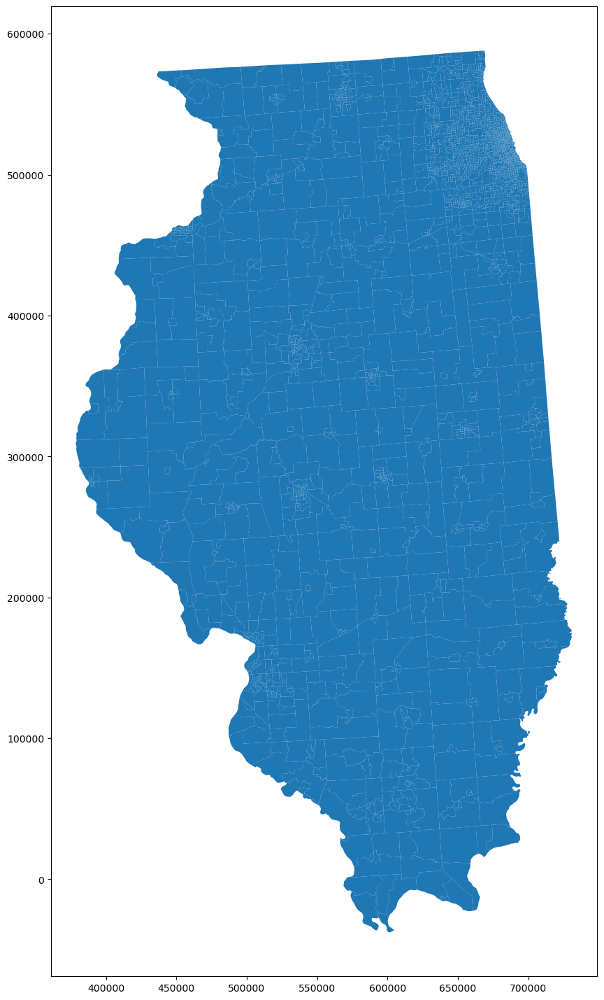

In [10]:
pop_data.plot(figsize=PARAMS["output"]["figsize"])

We can also load the catchments and do a bit of cleaning on those:

* ensure that the amount of hospital beds is positive for each hospital
* ensure that our catchment is a Polygon or Multipolygon (not a line or point)
* project the data

In [11]:
catchments = []
for dist_i, distance in enumerate(PARAMS["region"]["distances"]):
    catchments.append(gpd.read_file(os.path.join(PARAMS["region"]["dir"],PARAMS["region"]["catchment_file_pattern"].format(distance)), driver="GeoJSON"))
    catchments[dist_i] = catchments[dist_i][catchments[dist_i][PARAMS["resource"]["resource"]] > 0]
    catchments[dist_i] = catchments[dist_i].dropna(subset=[PARAMS["resource"]["resource"]])
    catchments[dist_i] = catchments[dist_i][(catchments[dist_i].geom_type == "Polygon") | (catchments[dist_i].geom_type == "MultiPolygon")]
    catchments[dist_i] = catchments[dist_i].to_crs(PARAMS["region"]["projection"])
catchments[0].head()

,OBJECTID,ID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,TELEPHONE,TYPE,...,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD,geometry
0,6309,0017362557,PANA COMMUNITY HOSPITAL,101 E NINTH STREET,PANA,IL,62557,NOT AVAILABLE,(217) 562-2131,CRITICAL ACCESS,...,http://www.panahospital.com,141341,NOT AVAILABLE,17,NON-PROFIT,-999,22,NOT AVAILABLE,Y,"POLYGON ((589158.156 222095.912, 582547.249 23..."
1,418,0014860942,HOOPESTON COMMUNITY MEMORIAL HOSPITAL,701 EAST ORANGE STREET,HOOPESTON,IL,60942,NOT AVAILABLE,(217) 283-5531,CRITICAL ACCESS,...,http://www.carle.org,141316,NOT AVAILABLE,17,NON-PROFIT,-999,99,NOT AVAILABLE,Y,"POLYGON ((700094.874 353986.215, 690179.032 36..."
2,419,0004761832,PRESENCE UNITED SAMARITANS MEDCTR-LOGAN,812 N LOGAN,DANVILLE,IL,61832,NOT AVAILABLE,(217) 443-5000,GENERAL ACUTE CARE,...,http://www.presencehealth.org/presence-united-...,140093,NOT AVAILABLE,17,NON-PROFIT,-999,127,NOT AVAILABLE,Y,"POLYGON ((706227.510 316050.564, 697520.512 32..."
3,475,0001261856,KIRBY MEDICAL CENTER,1000 MEDICAL CENTER DRIVE,MONTICELLO,IL,61856,NOT AVAILABLE,(217) 762-2115,CRITICAL ACCESS,...,http://www.kirbyhealth.org,0005785,NOT AVAILABLE,17,NON-PROFIT,-999,16,NOT AVAILABLE,Y,"POLYGON ((627801.177 303443.016, 622371.166 30..."
4,548,0004661801,THE CARLE FOUNDATION HOSPITAL,611 WEST PARK STREET,URBANA,IL,61801,NOT AVAILABLE,(217) 383-3311,GENERAL ACUTE CARE,...,http://www.carle.com/hospital,140091,NOT AVAILABLE,17,NON-PROFIT,-999,322,LEVEL I,Y,"POLYGON ((658174.237 311648.803, 654438.785 31..."


<Axes: >

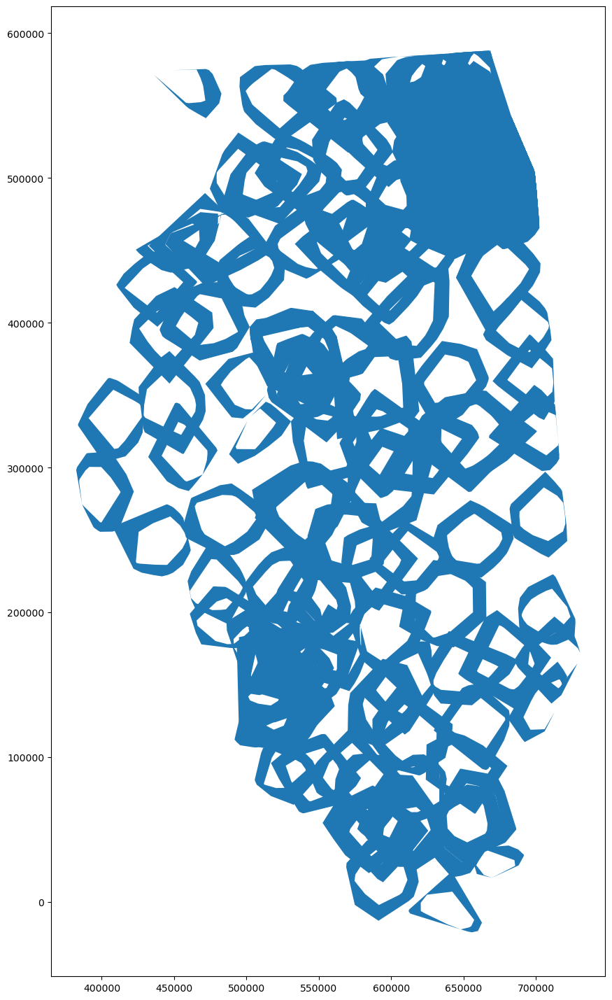

In [12]:
catchments[2].plot(figsize=PARAMS["output"]["figsize"])

In [13]:
result = e2sfca(catchments, PARAMS["access"]["val"], PARAMS["resource"]["key"], 
                pop_data,
                PARAMS["pop"]["pop_key"],
                PARAMS["pop"]["pop_field"],
                PARAMS["resource"]["resource"],
                PARAMS["region"]["distances"],
                PARAMS["access"]["weights"])

Calculating Intersections: 100%|██████████| 3/3 [00:00<00:00,  3.19it/s]


We have our accessibility calculated! Let's check it out:

In [14]:
result.head()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,...,F_TOTAL,E_UNINSUR,M_UNINSUR,EP_UNINSUR,MP_UNINSUR,E_DAYPOP,Shape_STAr,Shape_STLe,geometry,ratio-BEDS
0,17,ILLINOIS,IL,17031,Cook,17031381700,"Census Tract 3817, Cook County, Illinois",0.075986,0,11,...,-999,0,11,-999.0,-999.0,551,0.000021,0.020359,"POLYGON ((689645.410 513172.412, 689877.534 51...",0.004101
1,17,ILLINOIS,IL,17031,Cook,17031980000,"Census Tract 9800, Cook County, Illinois",7.679554,0,11,...,-999,0,11,-999.0,-999.0,38202,0.002171,0.222431,"POLYGON ((662183.100 533025.072, 662292.722 53...",0.004167
2,17,ILLINOIS,IL,17031,Cook,17031980100,"Census Tract 9801, Cook County, Illinois",1.151272,0,11,...,-999,0,11,-999.0,-999.0,6449,0.000323,0.076961,"POLYGON ((678843.600 510378.604, 679647.276 51...",0.003924
3,17,ILLINOIS,IL,17097,Lake,17097863005,"Census Tract 8630.05, Lake County, Illinois",0.393745,440,607,...,-999,0,11,-999.0,-999.0,108,0.000111,0.053599,"POLYGON ((666628.417 566052.998, 666641.522 56...",0.001473
4,17,ILLINOIS,IL,17097,Lake,17097863006,"Census Tract 8630.06, Lake County, Illinois",0.080025,0,11,...,-999,0,11,-999.0,-999.0,2642,0.000023,0.018743,"POLYGON ((666290.205 566023.937, 666268.776 56...",0.001473


Let's project our result and adjust the numbers so they are a bit more human friendly by calculating hospital beds per thousand people rather than per person.

In [15]:
result = result.to_crs(PARAMS["access"]["projection"])

In [16]:
result[PARAMS["access"]["val"]] = result[PARAMS["access"]["val"]] * 1000

To create our plot, let's add the outline of the state. To do that, we can load the county data and dissolve by state:

<Axes: >

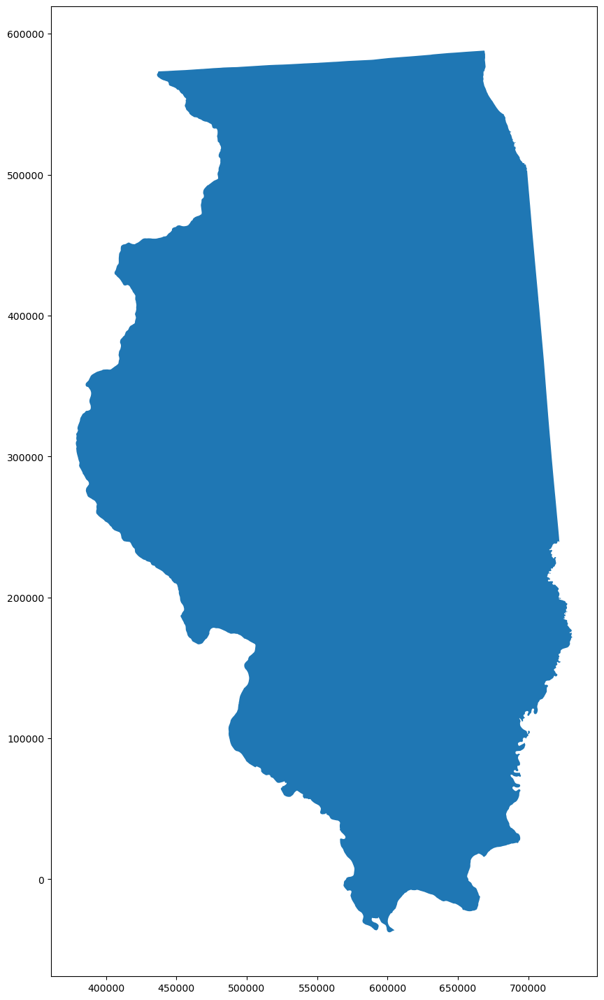

In [17]:
spatial_extent = gpd.read_file(PARAMS["graphml"]["geo_unit_shapefile"])
spatial_extent = spatial_extent.to_crs(PARAMS["access"]["projection"])
spatial_extent = spatial_extent.dissolve(by="STATEFP")
spatial_extent.plot(figsize=PARAMS["output"]["figsize"])

Lastly, let's plot our result:

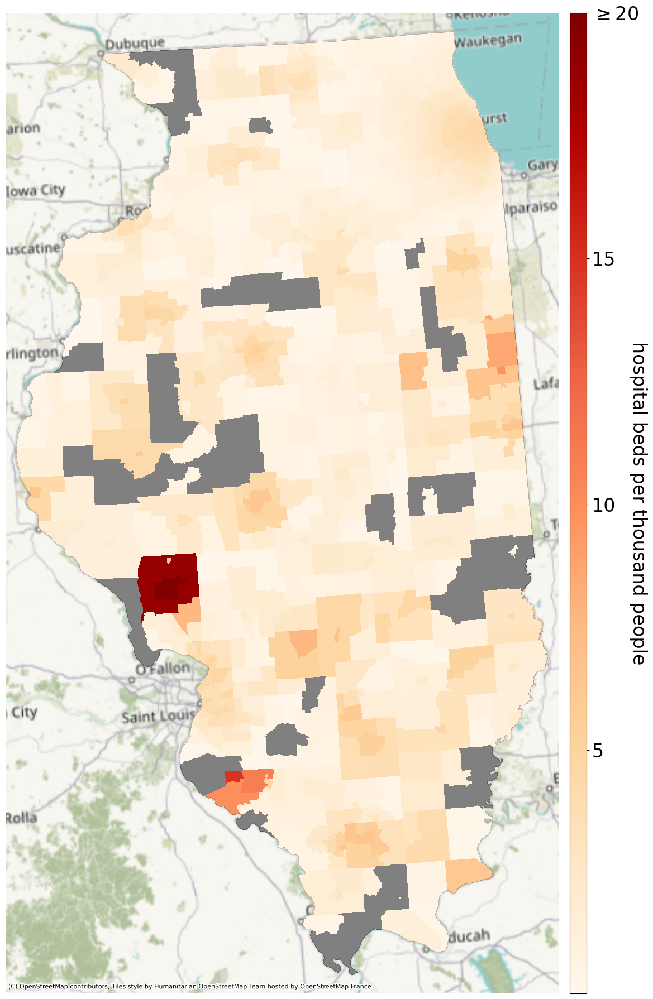

In [18]:
output_map(result, spatial_extent, PARAMS["access"]["val"],
           save=os.path.join(PARAMS["region"]["dir"], "E2SFCA-OrRd.jpg"), cmap='OrRd', 
           figsize=PARAMS["output"]["figsize"], colorbar_text="hospital beds per thousand people",
           vmax=20, integer_ticks=5)

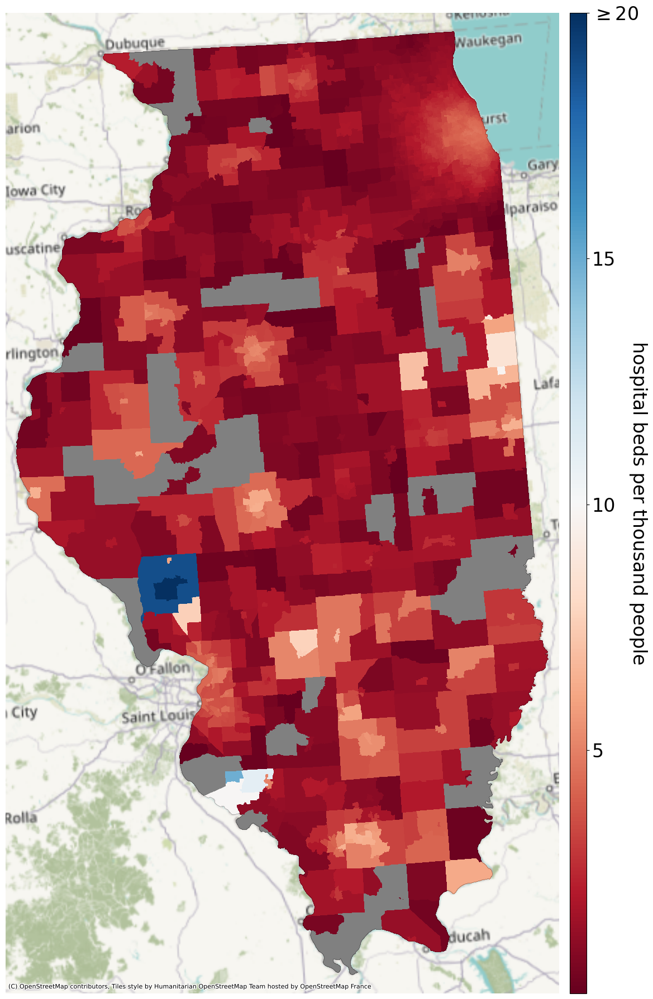

In [19]:
output_map(result, spatial_extent, PARAMS["access"]["val"],
           save=os.path.join(PARAMS["region"]["dir"], "E2SFCA-RdBu.jpg"), cmap='RdBu', 
           figsize=PARAMS["output"]["figsize"], colorbar_text="hospital beds per thousand people",
           vmax=20, integer_ticks=5)

<hr id="mw">

# Midwest

In [20]:
PARAMS = {
    "access": {
        "weights": [1.0, 0.68, 0.22],
        "projection": "ESRI:102003"
    },
    "compute": {
        "max_memory" : 20,
        "threads" : 8
    },
    "graphml": {
        "geo_unit_key" : "GEOID",
        "geo_unit_shapefile" : "../data/geodata/counties/MidwestCounties/MidwestCounties.shp",
        "dir" : "/data/cigi/common/michels9/Midwest-Counties/graphml",
        "name_format" : "0500000US{}.graphml",
        "memory_csv" : "../data/memory_df/MidwestCounty-MemoryUsage.csv",
        "memory_column" : "Memory Usage (GB)",
        "memory_key" : "GEOID"
    },
    "output": {
        "figsize": [16,12],
    },
    "pop" : {
        "file": "../data/pop/midwest/Midwest_SVI_CT.shp",
        "pop_field": "E_TOTPOP",
        "pop_key": "FIPS"
    },
    "region" : {
        "batch_size": 8,
        "buffer": 64374,
        "catchment_file_pattern": "resource_catchments_{}distance.geojson",
        "catchment_how": "convexhull",
        "distances": [600, 1200, 1800],
        "dir": "../data/regions/Midwest",
        "projection" : "ESRI:102003"
    },
    "resource" : {
        "key": "ID",
        "resource": "BEDS",
        "shapefile" : "../data/hospitals/midwest/MidwestHospitals.shp"
    }
}
PARAMS["access"]["val"] = "ratio-{}".format(PARAMS["resource"]["resource"])

In [21]:
pop_data = gpd.read_file(PARAMS["pop"]["file"])
pop_data = pop_data.to_crs(PARAMS["region"]["projection"])
pop_data[PARAMS["pop"]["pop_key"]] = pop_data[PARAMS["pop"]["pop_key"]].fillna(value=0)
pop_data.head()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,...,F_THEME4,F_TOTAL,E_UNINSUR,M_UNINSUR,EP_UNINSUR,MP_UNINSUR,E_DAYPOP,Shape_STAr,Shape_STLe,geometry
0,17,ILLINOIS,IL,17031,Cook,17031381700,"Census Tract 3817, Cook County, Illinois",0.075986,0,11,...,-999,-999,0,11,-999.0,-999.0,551,0.000021,0.020359,"POLYGON ((689645.410 513172.412, 689877.534 51..."
1,17,ILLINOIS,IL,17031,Cook,17031980000,"Census Tract 9800, Cook County, Illinois",7.679554,0,11,...,-999,-999,0,11,-999.0,-999.0,38202,0.002171,0.222431,"POLYGON ((662183.100 533025.072, 662292.722 53..."
2,17,ILLINOIS,IL,17031,Cook,17031980100,"Census Tract 9801, Cook County, Illinois",1.151272,0,11,...,-999,-999,0,11,-999.0,-999.0,6449,0.000323,0.076961,"POLYGON ((678843.600 510378.604, 679647.276 51..."
3,17,ILLINOIS,IL,17097,Lake,17097863005,"Census Tract 8630.05, Lake County, Illinois",0.393745,440,607,...,-999,-999,0,11,-999.0,-999.0,108,0.000111,0.053599,"POLYGON ((666628.417 566052.998, 666641.522 56..."
4,17,ILLINOIS,IL,17097,Lake,17097863006,"Census Tract 8630.06, Lake County, Illinois",0.080025,0,11,...,-999,-999,0,11,-999.0,-999.0,2642,0.000023,0.018743,"POLYGON ((666290.205 566023.937, 666268.776 56..."


<Axes: >

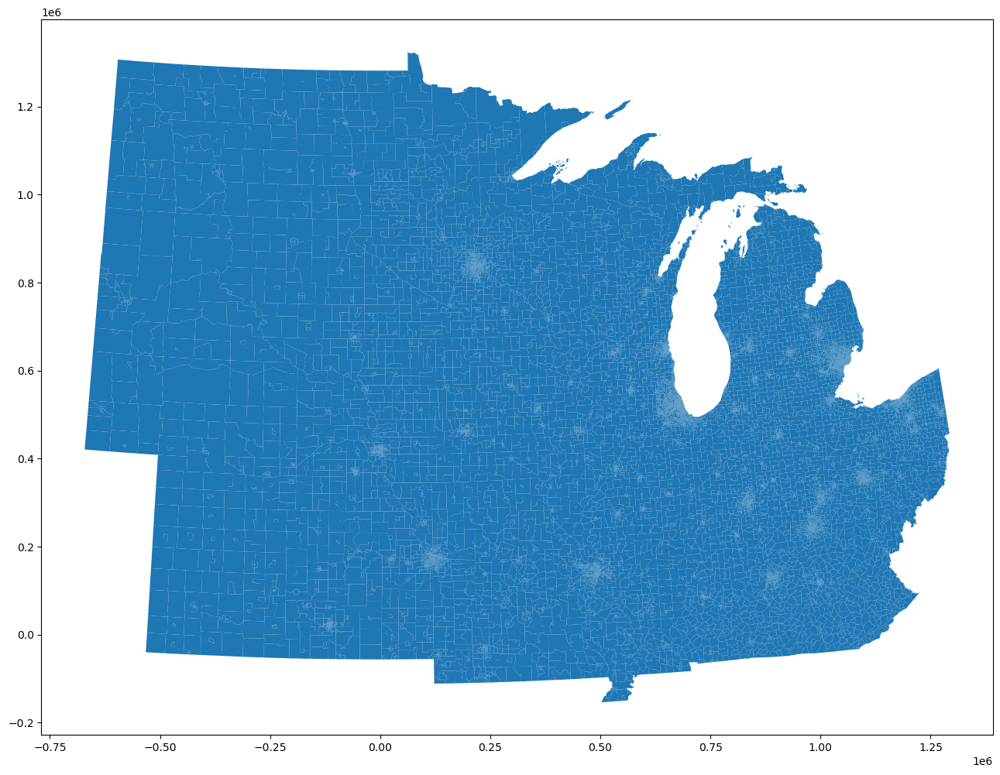

In [22]:
pop_data.plot(figsize=PARAMS["output"]["figsize"])

In [23]:
catchments = []
for dist_i, distance in enumerate(PARAMS["region"]["distances"]):
    catchments.append(gpd.read_file(os.path.join(PARAMS["region"]["dir"],PARAMS["region"]["catchment_file_pattern"].format(distance)), driver="GeoJSON"))
    catchments[dist_i] = catchments[dist_i][catchments[dist_i][PARAMS["resource"]["resource"]] > 0]
    catchments[dist_i] = catchments[dist_i].dropna(subset=[PARAMS["resource"]["resource"]])
    catchments[dist_i] = catchments[dist_i][(catchments[dist_i].geom_type == "Polygon") | (catchments[dist_i].geom_type == "MultiPolygon")]
    catchments[dist_i] = catchments[dist_i].to_crs(PARAMS["region"]["projection"])
catchments[0].head()

,OBJECTID,ID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,TELEPHONE,TYPE,...,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD,geometry
0,1060,0152254720,OAKLEAF SURGICAL HOSPITAL,1000 OAKLEAF WAY,ALTOONA,WI,54720,NOT AVAILABLE,(715) 831-8130,GENERAL ACUTE CARE,...,http://www.oakleafsurgical.com,303,NOT AVAILABLE,55,NOT AVAILABLE,-999,13,NOT AVAILABLE,N,"POLYGON ((359856.118 814782.041, 352395.671 82..."
1,1496,0000655102,UNITED HOSPITAL,333 NORTH SMITH AVENUE,ST PAUL,MN,55102,NOT AVAILABLE,(651) 241-8000,GENERAL ACUTE CARE,...,https://www.allinahealth.org/United-Hospital/,525,NOT AVAILABLE,27,NON-PROFIT,-999,546,LEVEL III,Y,"POLYGON ((227080.349 824935.191, 224498.286 82..."
2,1497,0003555422,REGENCY HOSPITAL OF MPLS LLC,1300 HIDDEN LAKES PARKWAY,GOLDEN VALLEY,MN,55422,NOT AVAILABLE,(763) 588-2750,GENERAL ACUTE CARE,...,http://www.regencyhospital.com,158,NOT AVAILABLE,27,GOVERNMENT - DISTRICT/AUTHORITY,-999,92,NOT AVAILABLE,N,"POLYGON ((208951.861 830792.244, 205006.482 83..."
3,1978,0002554701,SACRED HEART HSPTL,900 W CLAIREMONT AVE,EAU CLAIRE,WI,54701,NOT AVAILABLE,(715) 717-4131,GENERAL ACUTE CARE,...,http://www.sacredhearteauclaire.org,17,NOT AVAILABLE,55,NON-PROFIT,-999,344,NOT AVAILABLE,Y,"POLYGON ((350237.435 815116.087, 347700.464 81..."
4,1988,0009854736,CHIPPEWA VALLEY HSPTL,"1220 3RD AVE W, PO BOX 224",DURAND,WI,54736,NOT AVAILABLE,(715) 672-4211,GENERAL ACUTE CARE,...,http://www.chippewavalleyhospital.com/,1008,NOT AVAILABLE,55,NON-PROFIT,-999,25,LEVEL IV,Y,"POLYGON ((313364.766 799778.300, 308509.207 80..."


<Axes: >

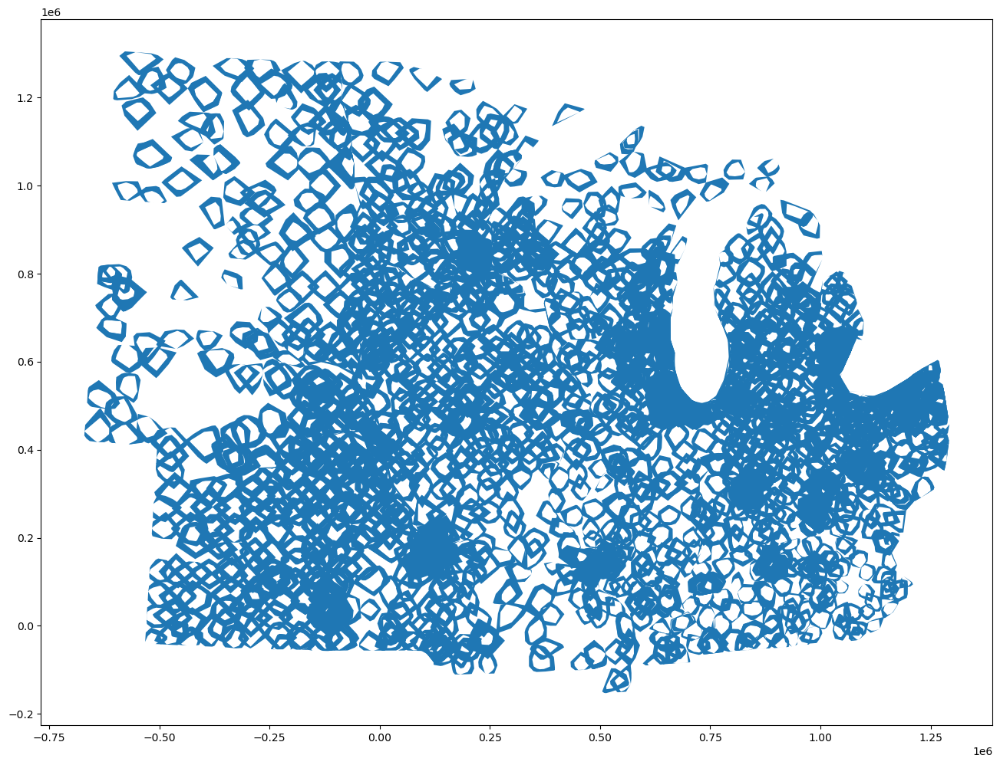

In [24]:
catchments[2].plot(figsize=PARAMS["output"]["figsize"])

In [25]:
result = e2sfca(catchments, PARAMS["access"]["val"], PARAMS["resource"]["key"], 
                   pop_data,
                   PARAMS["pop"]["pop_key"],
                   PARAMS["pop"]["pop_field"],
                   PARAMS["resource"]["resource"],
                   PARAMS["region"]["distances"],
                   PARAMS["access"]["weights"])

Calculating Intersections: 100%|██████████| 3/3 [00:03<00:00,  1.05s/it]


In [26]:
result.head()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,AREA_SQMI,E_TOTPOP,M_TOTPOP,...,F_TOTAL,E_UNINSUR,M_UNINSUR,EP_UNINSUR,MP_UNINSUR,E_DAYPOP,Shape_STAr,Shape_STLe,geometry,ratio-BEDS
0,17,ILLINOIS,IL,17031,Cook,17031381700,"Census Tract 3817, Cook County, Illinois",0.075986,0,11,...,-999,0,11,-999.0,-999.0,551,0.000021,0.020359,"POLYGON ((689645.410 513172.412, 689877.534 51...",0.004524
1,17,ILLINOIS,IL,17031,Cook,17031980000,"Census Tract 9800, Cook County, Illinois",7.679554,0,11,...,-999,0,11,-999.0,-999.0,38202,0.002171,0.222431,"POLYGON ((662183.100 533025.072, 662292.722 53...",0.004148
2,17,ILLINOIS,IL,17031,Cook,17031980100,"Census Tract 9801, Cook County, Illinois",1.151272,0,11,...,-999,0,11,-999.0,-999.0,6449,0.000323,0.076961,"POLYGON ((678843.600 510378.604, 679647.276 51...",0.004004
3,17,ILLINOIS,IL,17097,Lake,17097863005,"Census Tract 8630.05, Lake County, Illinois",0.393745,440,607,...,-999,0,11,-999.0,-999.0,108,0.000111,0.053599,"POLYGON ((666628.417 566052.998, 666641.522 56...",0.001478
4,17,ILLINOIS,IL,17097,Lake,17097863006,"Census Tract 8630.06, Lake County, Illinois",0.080025,0,11,...,-999,0,11,-999.0,-999.0,2642,0.000023,0.018743,"POLYGON ((666290.205 566023.937, 666268.776 56...",0.001478


In [27]:
result = result.to_crs(PARAMS["access"]["projection"])

In [28]:
result[PARAMS["access"]["val"]] = result[PARAMS["access"]["val"]] * 1000

To create our plot, let's add the outline of the state. To do that, we can load the county data and dissolve by state:

<Axes: >

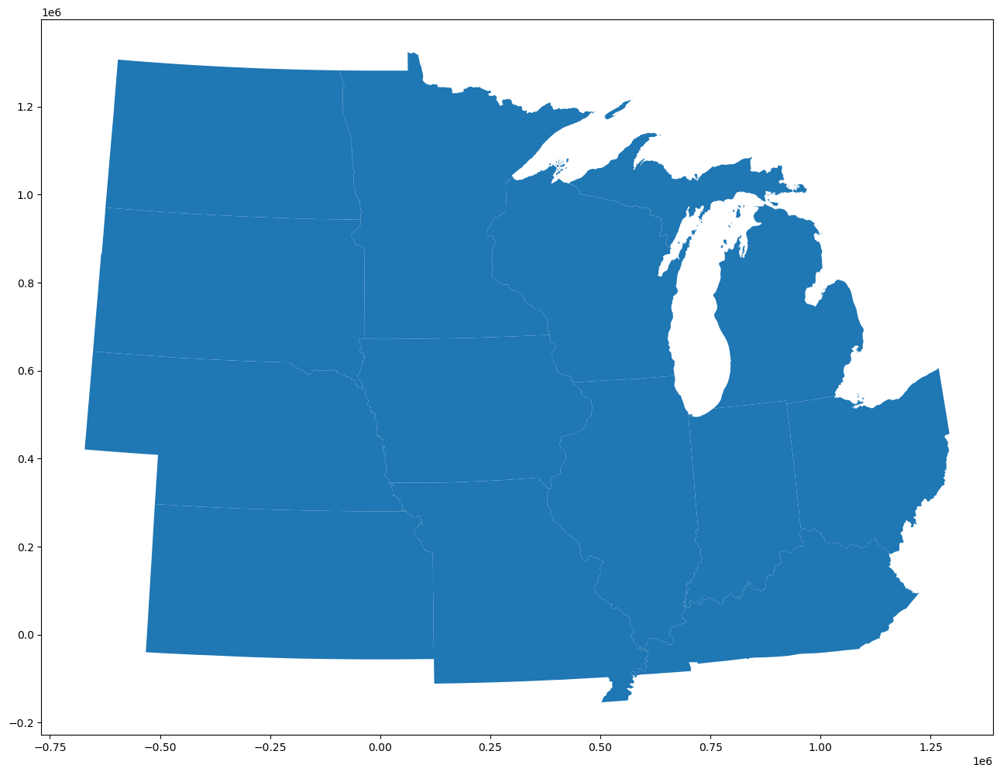

In [29]:
spatial_extent = gpd.read_file(PARAMS["graphml"]["geo_unit_shapefile"])
spatial_extent = spatial_extent.to_crs(PARAMS["access"]["projection"])
spatial_extent = spatial_extent.dissolve(by="STATEFP")
spatial_extent.plot(figsize=PARAMS["output"]["figsize"])

Lastly, let's plot our result:

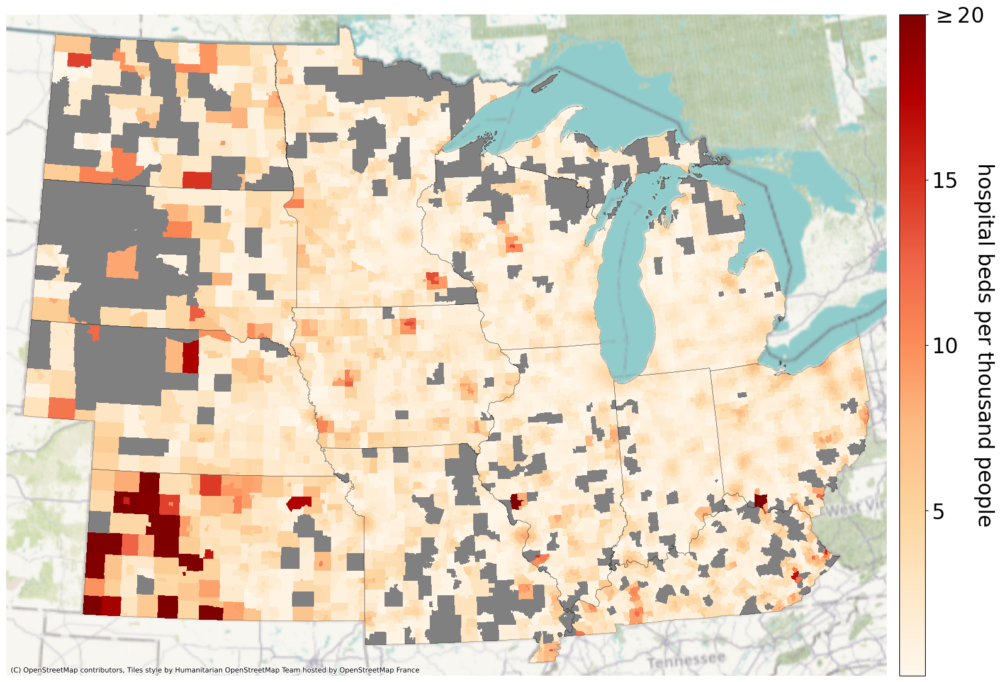

In [30]:
output_map(result, spatial_extent, PARAMS["access"]["val"],
           save=os.path.join(PARAMS["region"]["dir"], "E2SFCA-OrRd.jpg"), cmap='OrRd', 
           figsize=PARAMS["output"]["figsize"], colorbar_text="hospital beds per thousand people",
           vmax=20, integer_ticks=5)

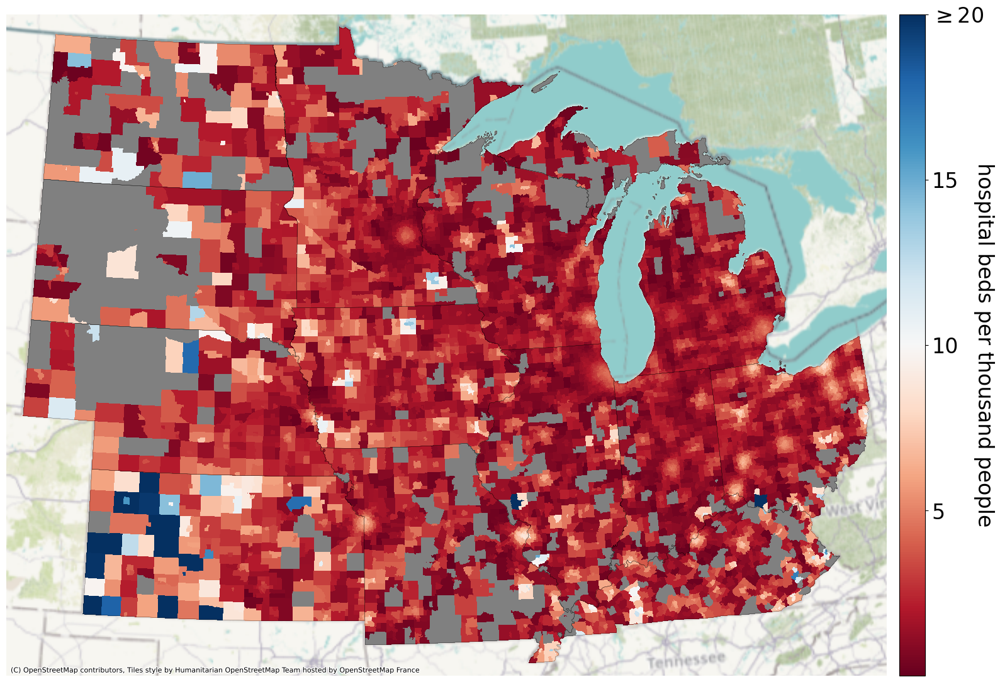

In [31]:
output_map(result, spatial_extent, PARAMS["access"]["val"],
           save=os.path.join(PARAMS["region"]["dir"], "E2SFCA-RdBu.jpg"), cmap='RdBu', 
           figsize=PARAMS["output"]["figsize"], colorbar_text="hospital beds per thousand people",
           vmax=20, integer_ticks=5)

<hr id="cont">

# Contiguous US

In [32]:
PARAMS = {
    "access": {
        "weights": [1.0, 0.68, 0.22],
        "projection" : "ESRI:102003",
    },
    "compute": {
        "max_memory" : 30,
        "threads" : 8
    },
    "graphml": {
        "geo_unit_key" : "GEOID",
        "geo_unit_shapefile" : "../data/geodata/counties/ConterminousCounties/ContinentalUS.shp",
        "dir" : "/data/cigi/common/michels9/graphmls/Continental/Continental-10kBuffer-20210628/graphml",
        "name_format" : "0500000US{}.graphml",
        "memory_csv" : "../data/memory_df/Continental-MemoryUsage.csv",
        "memory_column" : "Memory Usage (GB)",
        "memory_key" : "GEOID"
    },
    "output": {
        "figsize": [20,12],
    },
    "pop" : {
        "file": "../data/pop/continental/Continental_SVI_CT.shp",
        "pop_field": "E_TOTPOP",
        "pop_key": "FIPS"
    },
    "region" : {
        "batch_size": 8,
        "buffer": 64374,
        "catchment_file_pattern": "resource_catchments_{}distance.geojson",
        "catchment_how": "convexhull",
        "distances": [600, 1200, 1800],
        "dir": "../data/regions/Conterminous",
        "projection" : "ESRI:102003"
    },
    "resource" : {
        "key": "ID",
        "resource": "BEDS",
        "shapefile" : "../data/hospitals/continental/ContinentalHospitals.shp"
    }
}
PARAMS["access"]["val"] = "ratio-{}".format(PARAMS["resource"]["resource"])

In [33]:
pop_data = gpd.read_file(PARAMS["pop"]["file"])
pop_data = pop_data.to_crs(PARAMS["region"]["projection"])
pop_data[PARAMS["pop"]["pop_key"]] = pop_data[PARAMS["pop"]["pop_key"]].fillna(value=0)
pop_data.head()

,FIPS,E_TOTPOP,geometry
0,01015981901,0,"POLYGON ((917741.176 -378823.501, 917800.175 -..."
1,01015981902,0,"POLYGON ((917224.459 -377489.227, 917222.004 -..."
2,01015981903,0,"POLYGON ((938858.539 -378673.916, 939010.699 -..."
3,01097003605,899,"POLYGON ((745344.952 -729566.440, 745471.272 -..."
4,01097990000,0,"MULTIPOLYGON (((760323.731 -749311.532, 760524..."


<Axes: >

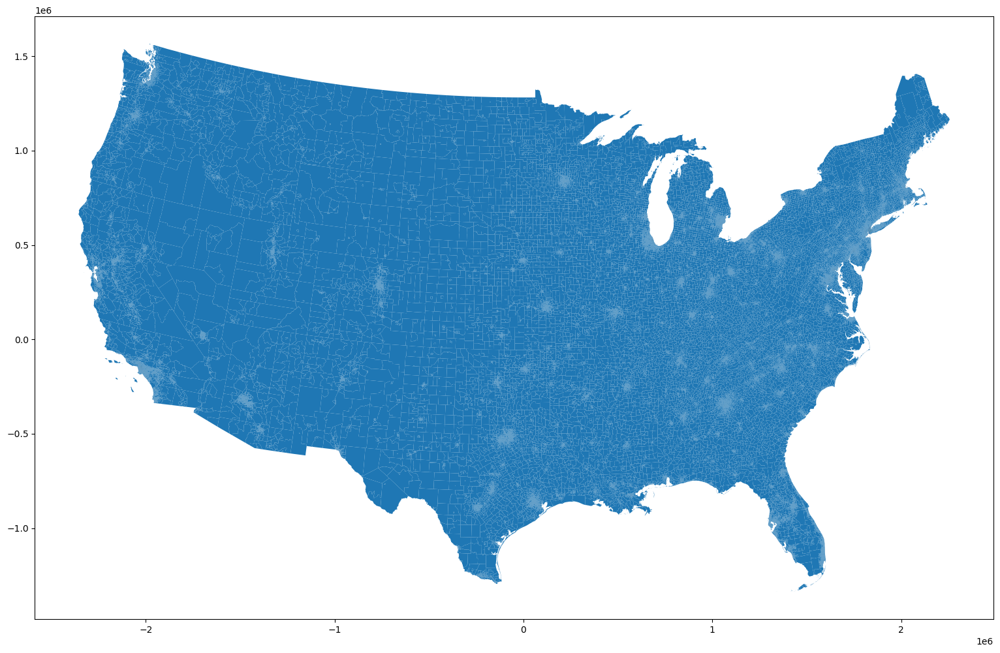

In [34]:
pop_data.plot(figsize=PARAMS["output"]["figsize"])

In [35]:
catchments = []
for dist_i, distance in enumerate(PARAMS["region"]["distances"]):
    catchments.append(gpd.read_file(os.path.join(PARAMS["region"]["dir"],PARAMS["region"]["catchment_file_pattern"].format(distance)), driver="GeoJSON"))
    catchments[dist_i] = catchments[dist_i][catchments[dist_i][PARAMS["resource"]["resource"]] > 0]
    catchments[dist_i] = catchments[dist_i].dropna(subset=[PARAMS["resource"]["resource"]])
    catchments[dist_i] = catchments[dist_i][(catchments[dist_i].geom_type == "Polygon") | (catchments[dist_i].geom_type == "MultiPolygon")]
    catchments[dist_i] = catchments[dist_i].to_crs(PARAMS["region"]["projection"])
catchments[0].head()

,OBJECTID,ID,NAME,ADDRESS,CITY,STATE,ZIP,ZIP4,TELEPHONE,TYPE,...,WEBSITE,STATE_ID,ALT_NAME,ST_FIPS,OWNER,TTL_STAFF,BEDS,TRAUMA,HELIPAD,geometry
1,1452,0001806226,WINDHAM COMMUNITY MEMORIAL HOSPITAL,112 MANSFIELD AVE,WILLIMANTIC,CT,06226,NOT AVAILABLE,(860) 456-9116,GENERAL ACUTE CARE,...,http://www.windhamhospital.org,070021,NOT AVAILABLE,09,NON-PROFIT,-999,130,NOT AVAILABLE,Y,"POLYGON ((1950371.468 711696.002, 1938041.422 ..."
2,1453,0001606460,MILFORD HOSPITAL,300 SEASIDE AVENUE,MILFORD,CT,06460,NOT AVAILABLE,(203) 876-4000,GENERAL ACUTE CARE,...,http://www.milfordhospital.org,070019,NOT AVAILABLE,09,NON-PROFIT,-999,87,NOT AVAILABLE,N,"POLYGON ((1887441.980 640163.655, 1886326.073 ..."
3,1454,0002506418,GRIFFIN HOSPITAL,130 DIVISION ST,DERBY,CT,06418,NOT AVAILABLE,(203) 732-7500,GENERAL ACUTE CARE,...,http://www.griffinhealth.org,070031,NOT AVAILABLE,09,NON-PROFIT,-999,160,NOT AVAILABLE,N,"POLYGON ((1881680.654 645549.306, 1881124.573 ..."
4,1455,0002806050,THE HOSPITAL OF CENTRAL CONNECTICUT,100 GRAND STREET,NEW BRITAIN,CT,06050,NOT AVAILABLE,(860) 224-5011,GENERAL ACUTE CARE,...,http://www.thocc.org,070035,NOT AVAILABLE,09,NON-PROFIT,-999,229,NOT AVAILABLE,Y,"POLYGON ((1903705.525 690888.973, 1892138.461 ..."
6,1478,0004201201,BERKSHIRE MEDICAL CENTER - BERKSHIRE CAMPUS,725 NORTH STREET,PITTSFIELD,MA,01201,NOT AVAILABLE,(413) 447-2000,GENERAL ACUTE CARE,...,http://www.berkshirehealthsystems.org/BMC,2313,BERKSHIRE MEDICAL CENTER,25,NON-PROFIT,-999,298,LEVEL III,N,"POLYGON ((1841524.585 768065.684, 1837115.719 ..."


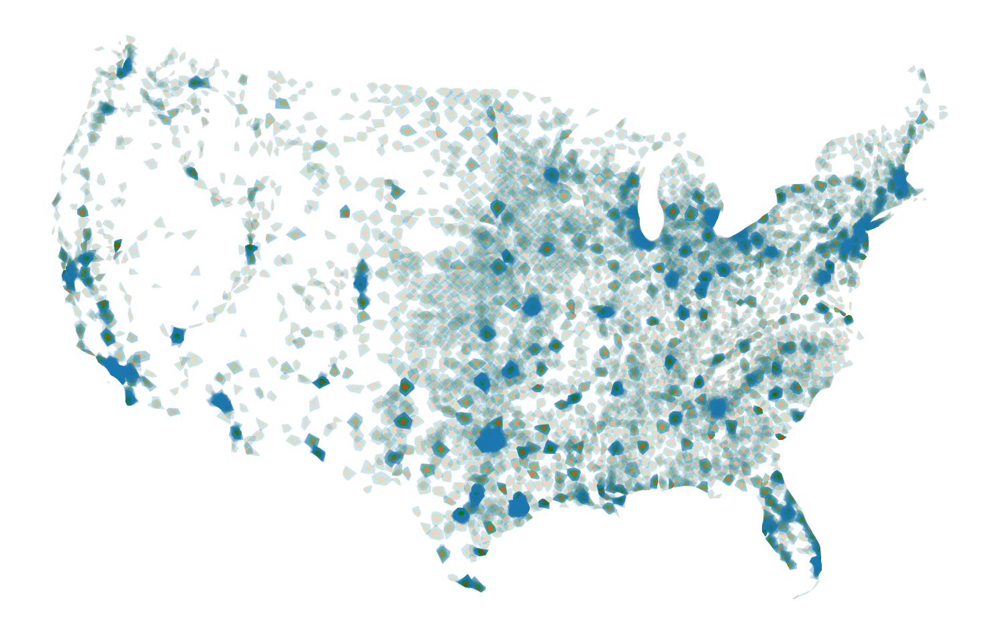

In [36]:
alpha = 0.2
ax = catchments[0].plot(figsize=PARAMS["output"]["figsize"], alpha=alpha, color='red')
catchments[1].plot(ax=ax, alpha=alpha, color='green')
catchments[2].plot(ax=ax, alpha=alpha)
ax.axis('off')
fig = plt.gcf()
fig.savefig(os.path.join(PARAMS["region"]["dir"], "ContinentalCatchments.jpg"), dpi=100, bbox_inches='tight')
plt.show()

In [37]:
result = e2sfca(catchments, PARAMS["access"]["val"], PARAMS["resource"]["key"], 
                   pop_data,
                   PARAMS["pop"]["pop_key"],
                   PARAMS["pop"]["pop_field"],
                   PARAMS["resource"]["resource"],
                   PARAMS["region"]["distances"],
                   PARAMS["access"]["weights"])

Calculating Intersections: 100%|██████████| 3/3 [00:11<00:00,  3.72s/it]


In [38]:
result.head()

,FIPS,E_TOTPOP,geometry,ratio-BEDS
0,01015981901,0,"POLYGON ((917741.176 -378823.501, 917800.175 -...",0.004066
1,01015981902,0,"POLYGON ((917224.459 -377489.227, 917222.004 -...",0.004614
2,01015981903,0,"POLYGON ((938858.539 -378673.916, 939010.699 -...",0.004115
3,01097003605,899,"POLYGON ((745344.952 -729566.440, 745471.272 -...",0.005814
4,01097990000,0,"MULTIPOLYGON (((760323.731 -749311.532, 760524...",NaN


In [39]:
result = result.to_crs(PARAMS["access"]["projection"])

In [40]:
result[PARAMS["access"]["val"]] = result[PARAMS["access"]["val"]] * 1000

To create our plot, let's add the outline of the state. To do that, we can load the county data and dissolve by state:

<Axes: >

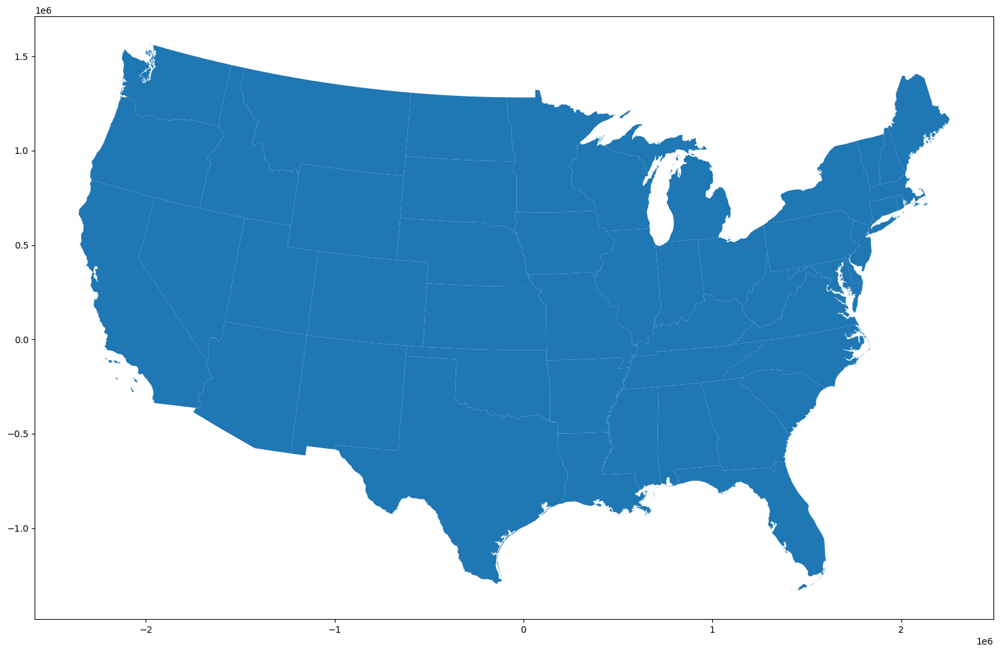

In [41]:
spatial_extent = gpd.read_file(PARAMS["graphml"]["geo_unit_shapefile"])
spatial_extent = spatial_extent.to_crs(PARAMS["access"]["projection"])
spatial_extent = spatial_extent.dissolve(by="STATEFP")
spatial_extent.plot(figsize=PARAMS["output"]["figsize"])

Lastly, let's plot our result:

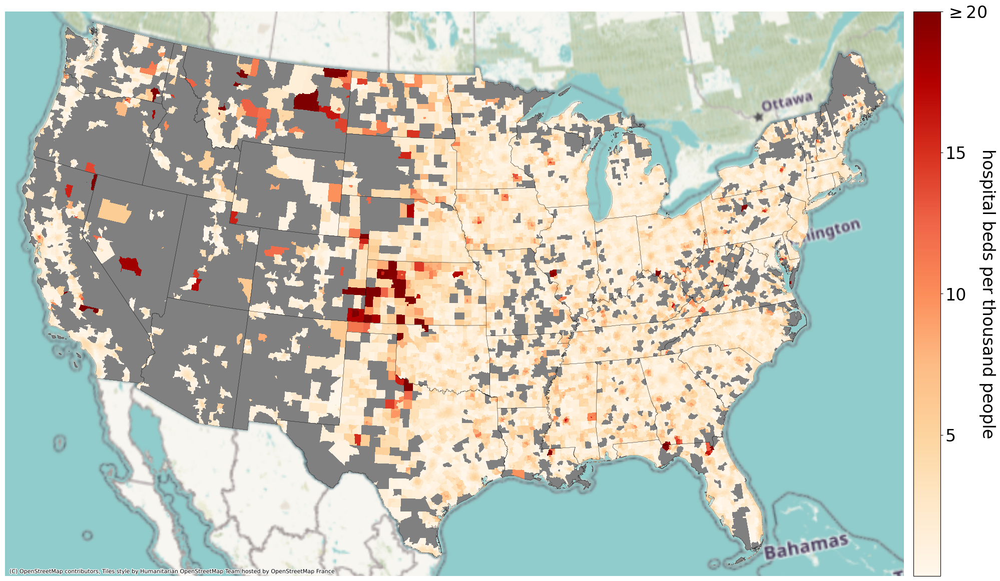

In [42]:
output_map(result, spatial_extent, PARAMS["access"]["val"],
           save=os.path.join(PARAMS["region"]["dir"], "E2SFCA-OrRd.jpg"), cmap='OrRd', 
           figsize=PARAMS["output"]["figsize"], colorbar_text="hospital beds per thousand people",
           vmax=20, integer_ticks=5)

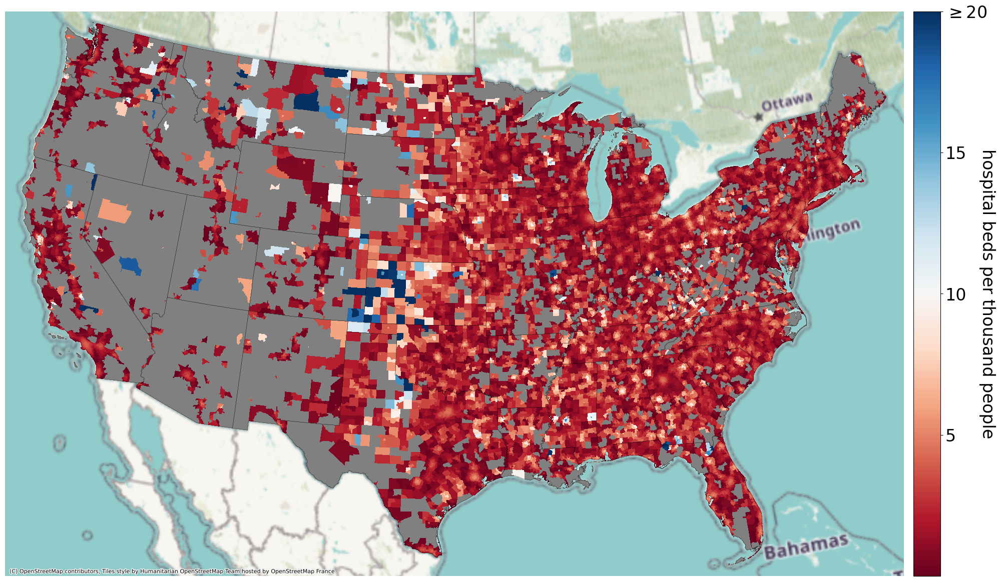

In [43]:
output_map(result, spatial_extent, PARAMS["access"]["val"],
           save=os.path.join(PARAMS["region"]["dir"], "E2SFCA-RdBu.jpg"), cmap='RdBu', 
           figsize=PARAMS["output"]["figsize"], colorbar_text="hospital beds per thousand people",
           vmax=20, integer_ticks=5)